
# <p style="text-align: center;">MIS382: Advanced Predictive Modeling</p>
# <p style="text-align: center;">Assignment 3</p>
## <p style="text-align: center;">Total points: 75</p>
## <p style="text-align: center;">Due: Thursday, October 22nd, submitted via Canvas by 11:59 pm</p>

Your homework should be written in a **Jupyter notebook**. You may work in groups of two if you wish. Your partner needs to be from the same section. Only one student per team needs to submit the assignment on Canvas.  But be sure to include name and UTEID for both students.  Homework groups will be created and managed through Canvas, so please do not arbitrarily change your homework group. If you do change, let the TA know. 

Please ensure that the notebook you have uploaded on Canvas is the correct one, you could download the notebook from Canvas to double check that you have submitted the correct version on your notebook.

Also, please make sure your code runs and the graphics (and anything else) are displayed in your notebook before submitting. (%matplotlib inline)

### Name(s)
1. Gabriel James GDJ337

# Question 1 - Stochastic Gradient Descent (30 pts)

1. (5pts) Using stochastic gradient descent, derive the coefficent updates for all 5 coefficients of the model: $$ y = w_0 + w_1x_1 + w_2x_1x_2 + w_3x_1^2x_2^2 + w_4x_2^3$$ Hint: start from the cost function (Assume sum of squared error). If you write the math by hand, include the image in your notebook and upload the image in the submission.


2. (20pts) Write Python code for an SGD solution to the non-linear model$$ y = w_0 + w_1x_1 + w_2x_1x_2 + w_3x_1^2x_2^2 + w_4x_2^3$$ Try to format similarly to scikit-learn's models. The template of the class is given. The init function of the class takes as input the learning_rate, regularization_constant and number of epochs. The fit method must take as input X,y and a choice of update_rule as 'sgd' or 'sgd_momentum' or 'Adagrad'. The _predict_ method takes an X value (optionally, an array of values). Use your new gradient descent regression to predict the data given in 'samples.csv', for 15 epochs, using learning rates: [0, .0001, .001, .01, 0.1, 1, 10, 100] and regularization (ridge regression) constants: [0,10,100] . Plot MSE and the $w$ parameters as a function of epoch (for 15 epochs) for the best 2 combinations of learning_rate and regularization for SGD, SGD-Momentum and Adagrad. I.e., you should have one plot of MSE and another for the parameter updates for SGD, SGD-Momentum and Adagrad (6 plots total). (2pts) Report the MSE at the end of 15 epochs for the two best combinations in each of SGD, SGD-Momentum and Adagrad.

Here are two blogs which you can go through to know about Adagrad - [blog 1](https://medium.com/konvergen/an-introduction-to-adagrad-f130ae871827) and [blog 2](http://ruder.io/optimizing-gradient-descent/).


3. (5pts) Based on the experiments, which of the 3 techniques allowed for a larger initial setting of the learning_rate? Why?


## Answer 

### 1.

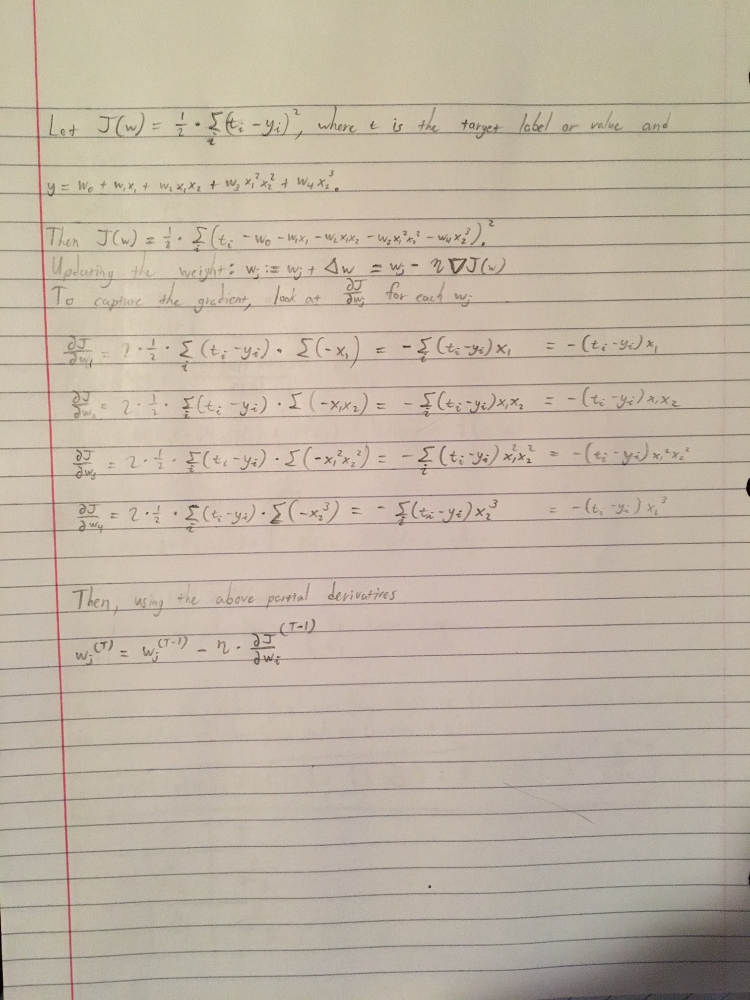

In [151]:
from IPython.display import Image
Image("HW3_Q1.png")

### 2.

In [1]:
%matplotlib inline
import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

class LinearRegression:
    
    def __init__(self, learning_rate, regularization, n_epoch):
        self.learning_rate = learning_rate
        self.n_epoch = n_epoch
        self.regularization = regularization
        self.eps = 10**-6
        self.coef = np.zeros(5) #one coef for each of the terms
        self.cache = np.zeros(self.coef.shape) #used only for adagrad
        self.mu = 0.9 #used in momentum
        
    def sgd(self, gradient):
        self.coef = self.coef - (self.learning_rate * gradient)
    
    def adagrad(self, gradient):
        self.cache = self.cache + (gradient ** 2)
        weight_update = (self.learning_rate/ (np.sqrt(self.cache + self.eps))) * gradient
        self.coef = self.coef - weight_update
    
    def sgd_momentum(self, gradient):
        self.v = (self.mu * self.v) - (self.learning_rate * gradient)
        self.coef = self.coef + self.v
    
        
    def fit(self, X, y, update_rule='sgd', plot=False):
        mse = []
        coefs = []
        self.cache = np.zeros(self.coef.shape)
        self.v = np.zeros(self.coef.shape)
        self.decay_rate = 0.9
        X = self.get_features(X)
        for epoch in range(self.n_epoch):
            for i in range(X.shape[0]):
                # Compute error
                X_i = X[i,:]
                e_i = self.linearPredict(X_i) - y[i]
                # Compute gradients
                gradient = (e_i * X_i) + (self.regularization * self.coef)
               
                # Update weights
                if update_rule == 'sgd':
                    self.sgd(gradient)
                if update_rule == 'adagrad':
                    self.adagrad(gradient)
                if update_rule == 'sgd_momentum':
                    self.sgd_momentum(gradient)
                if update_rule == 'rmsprop':
                    self.rmsprop(gradient)
   
            coefs.append(self.coef)
            residuals = y - self.linearPredict(X)         
            mse.append(np.mean(residuals**2))
        self.lowest_mse = mse[-1]
        if plot == True:
            plt.figure()
            plt.plot(range(self.n_epoch),mse)
            plt.xlabel('epoch')
            plt.ylabel('MSE')
            plt.figure()
            coefs = np.array(coefs)
            plt.plot(range(self.n_epoch),coefs[:,0],label='w0')
            plt.plot(range(self.n_epoch),coefs[:,1],label='w1')
            plt.plot(range(self.n_epoch),coefs[:,2],label='w2')
            plt.plot(range(self.n_epoch),coefs[:,3],label='w3')
            plt.legend()
            plt.xlabel('epoch')
            plt.ylabel('parameter value')

    def get_features(self, X):
        x = np.zeros((X.shape[0], 5))
        x[:,0] = 1
        x[:,1] = X[:,0]
        x[:,2] = X[:,0]*X[:,1]
        x[:,3] = (X[:,0]**2) * (X[:,1]**2)
        x[:,4] = X[:,1]**3
        
        return x
        
    def linearPredict(self, X):
        return X.dot(self.coef)
     

In [2]:
data = pd.read_csv('q1_samples.csv')
X = np.array([data['x1'].values, data['x2'].values]).T
y = data['y'].values
n_epochs = 15
learning_rate = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
regularization = [0, 10, 100]

### Using SGD

C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: overflow encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in subtract
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: overflow encountered in square
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: overflow encountered in add


(0.001, 0)
(0.01, 0)
[0.020878097917959082, 0.021781768945026436]


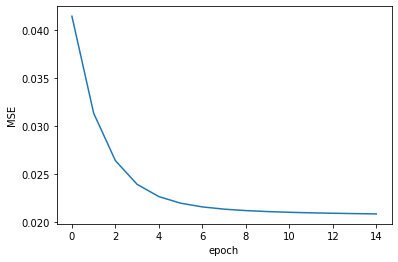

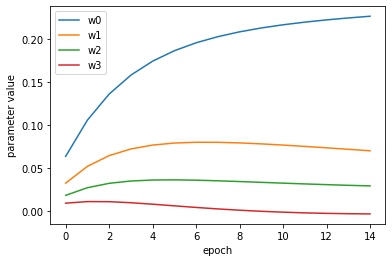

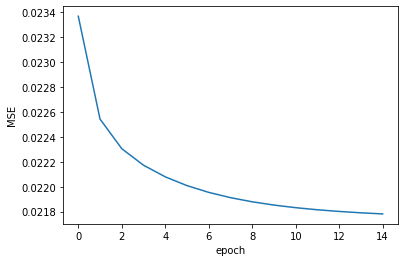

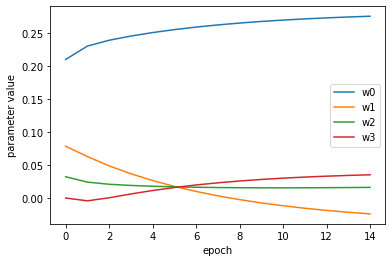

In [11]:
hyper = []
for lr in range(0, len(learning_rate)):
    for reg in range(0, len(regularization)):
        hyper.append((learning_rate[lr], regularization[reg]))
lowest_scores = []
for hyper_iter in range(0, len(hyper)):
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,plot=False)
    lowest_scores.append(sgd.lowest_mse)
    
chosen_hyper = np.argsort(np.array(lowest_scores))[:2]
print(hyper[chosen_hyper[0]])
print(hyper[chosen_hyper[1]])
lowest_scores = []
for hyper_iter in chosen_hyper:
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,plot=True)
    lowest_scores.append(sgd.lowest_mse)
print(lowest_scores)

sgd = LinearRegression(.01,0,n_epochs)


In [12]:
#best parameters for sgd
print(chosen_hyper)
print(hyper[3])  #lr
print(hyper[0])  #regularization

[3 6]
(0.001, 0)
(0.0001, 0)


### Using SGD-Momentum

C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: overflow encountered in square
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: overflow encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in subtract
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in multiply
C:\Users\gabej\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning: overflow encountered in add


[0.020263838535661462, 0.02087046249734365]


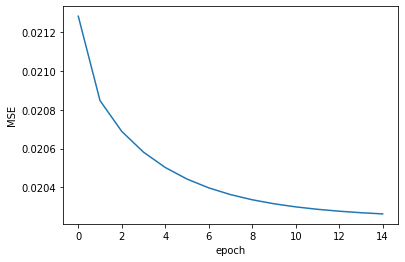

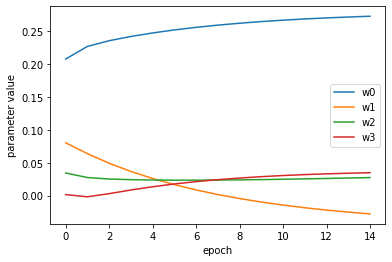

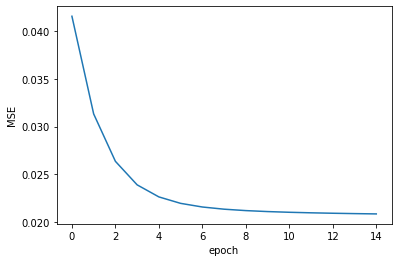

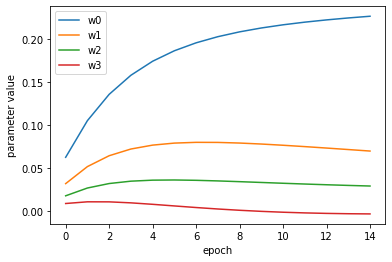

In [8]:
learning_rate = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
regularization = [0, 10, 100]
hyper = []
for lr in range(0, len(learning_rate)):
    for reg in range(0, len(regularization)):
        hyper.append((learning_rate[lr], regularization[reg]))
lowest_scores = []
for hyper_iter in range(0, len(hyper)):
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,update_rule='sgd_momentum',plot=False)
    lowest_scores.append(sgd.lowest_mse)
    
chosen_hyper = np.argsort(np.array(lowest_scores))[:2]
lowest_scores = []
for hyper_iter in chosen_hyper:
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,update_rule='sgd_momentum',plot=True)
    lowest_scores.append(sgd.lowest_mse)
print(lowest_scores)

In [9]:
#best parameters for sgd
print(chosen_hyper)
print(hyper[3])  #lr
print(hyper[0])  #regularization

[3 0]
(0.001, 0)
(0.0001, 0)


### Using Adagrad

[0.0202349014514659, 0.02101305455442806]


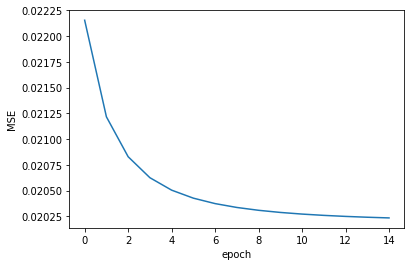

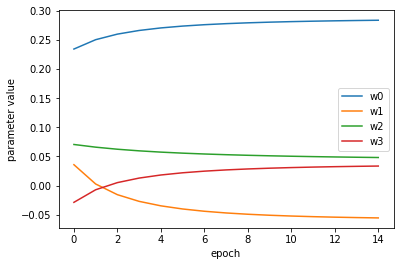

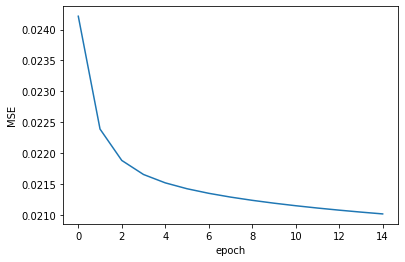

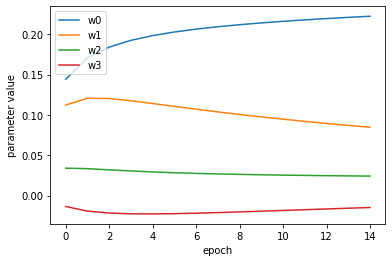

In [13]:
learning_rate = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
regularization = [0, 10, 100]
hyper = []
for lr in range(0, len(learning_rate)):
    for reg in range(0, len(regularization)):
        hyper.append((learning_rate[lr], regularization[reg]))
lowest_scores = []
for hyper_iter in range(0, len(hyper)):
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,update_rule='adagrad',plot=False)
    lowest_scores.append(sgd.lowest_mse)
    
chosen_hyper = np.argsort(np.array(lowest_scores))[:2]
lowest_scores = []
for hyper_iter in chosen_hyper:
    sgd = LinearRegression(hyper[hyper_iter][0], hyper[hyper_iter][1], n_epochs)
    sgd.fit(X,y,update_rule='adagrad',plot=True)
    lowest_scores.append(sgd.lowest_mse)
print(lowest_scores)

In [14]:
#best parameters for adagrad
print(chosen_hyper)
print(hyper[6])  #lr
print(hyper[9])  #regularization

[9 6]
(0.01, 0)
(0.1, 0)


### 3.

Ans.
Adagrad allows for the highest initial learning rate.  This is evident in the above results.

Mathematically, the learning rate for Adagrad decreases over each iteration as the square of the gradients increases.  This allows for a small enough learning rate after a sufficient number of iterations, which allows the model to find meaningful convergence.  Therefore, the initial learning rate can be set higher than it would be with other descent algorithms.

# 2.  Tensor Playground (25pts)
Visit http://playground.tensorflow.org for this problem

From the far right, select "Classification" as the problem type, and select the 4th of the four data sets (the spiral data which is bottom right).  

1) Use the following default settings - test/training ratio 50%, Noise 0, Batch Size 10, learning rate 0.03, one hidden layer with 4 neurons, input as X_1, X_2 and no Regularization. Run two experiments - one using Tanh as the activation function and one using the linear activation function. Report the train, test losses for both these experiments at the end of 1000 epochs(4 values). What difference do you observe in the decision boundary? Why? (4 pts)

2) Use the above setting, set the activation to be Tanh and learning rate to be 0.03. Report the train, test losses at the end of 1000 epochs for 2, 4, and 8 neurons in the hidden layer (6 values). What do you observe in the decision boundary as the number of neurons increases? Why? (4 pts)

3) Use the above setting, set the activation to be Tanh and have four neurons in the hidden layer. Report the train, test losses at the end of 100 epochs and 1000 epochs for learning rates of 3, 0.3, 0.03 and 0.003 (8 values). What do you observe in the loss curves? Explain. (4 pts)

4) Use the above setting, set the activation to be Tanh and learning rate to be 0.03. Use two hidden layers - first hidden layer with 6 neurons and second hidden layer with 4 neurons. Report the train, test values at the end of 2000 epochs (2 values) and attach the screenshot from Tensor playground. Explain the changes you see with this additional hidden layer. (5 pts).

5) Fix the test/training ratio 50% and Noise to 0 (same as before). Play around with any of the other hyperparameters, network architectures and input features (such as $sin(X_1), X_1^2$ etc.) and report the best train/test loss you could get (test loss should be atmost 0.06). Attach the screenshot from  Tensor playground for the same (show your full network, output and parameters). Briefly justify your decisions, and comment on difficulties/tradeoffs, what helps/what doesn't,etc.  (8 pts)
 

### ANSWER

### 1. 
Linear: (train: 0.47, test: 0.482)
tanh: (train: 0.351, test: 0.465)

The decision boundary for the linear activation function is linear, whereas the decision boundary for the tanh activation function is nonlinear.  This is because tanh applies a nonlinear transformation that allows for curves in the boundary.

### 2. 
2 Neurons: (train: 0.404, test: 0.454)
4 Neurons: (train: 0.470, test: 0.482)
6 Neurons: (train: 0.290, test: 0.437)

With 2 neurons, the decision boundary was a near-horizontal line resting above the highest blue point.

The 4 neuron model behaved very similarly to the 2 neuron model.

With 6 neurons, the decision boundary became very nonlinear, forming a sort of z shape.



### 3.
rate = 3, 100 epochs:      (train: 0.610, test: 0.549)
rate = 3, 1000 epochs:     (train: 0.553, test: 0.596)
rate = 0.3, 100 epochs:    (train: 0.462, test: 0.497)
rate = 0.3, 1000 epochs:   (train: 0.443, test: 0.496)
rate = 0.03, 100 epochs:   (train: 0.470, test: 0.486)
rate = 0.03, 1000 epochs:  (train: 0.363, test: 0.485)
rate = 0.003, 100 epochs:  (train: 0.476, test: 0.491)
rate = 0.003, 1000 epochs: (train: 0.469, test: 0.484)

At learning rate 3, the training and test loss fluxuate wildly.
At learning rate 0.3, the training loss drops much more than the test loss.
At learning rate 0.03, the training and test loss behave similarly, though the test loss is higher than training loss.
At learning rate 0.003, the training and test loss decrease sharply.  The test loss drops to a minimum at around 800 epochs.

### 4.

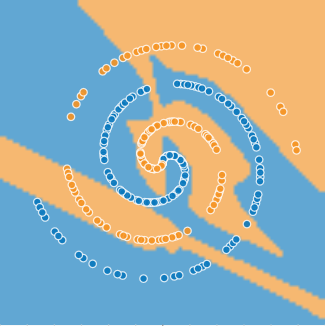

In [4]:
Image("HW3_Q2_4.png")

(train loss: 0.074, test loss: 0.298)

This is very much non-linear.  The network is better capturing the behavior of the data, but not entirely.  Previous results yielded a near-straight horizontal decision boundary.  Adding the additional layer allowed for more non-linearity and complexity in the model.

### 5.

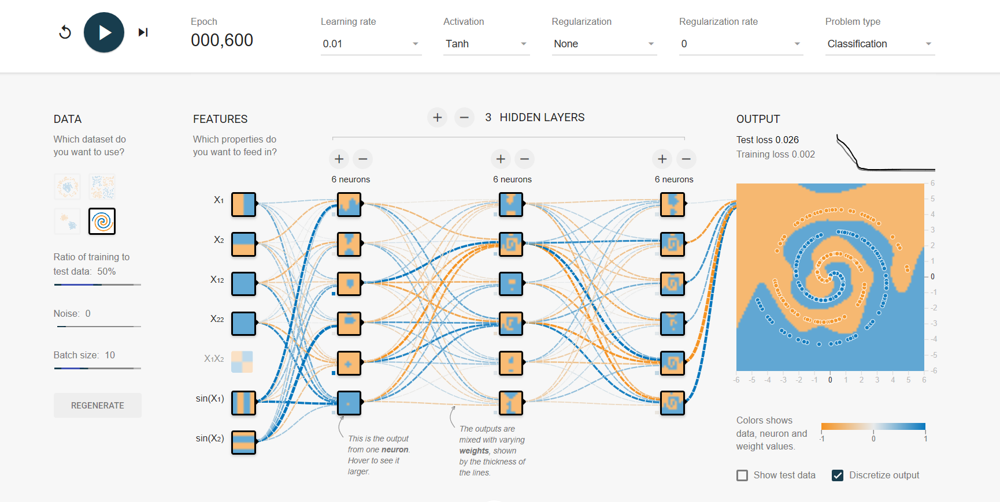

In [5]:
Image("HW3_Q2_5.png")

I first tried including X1, X2, and sin(X1) as the inputs with 2 layers with 6 and 4 neurons.  However, this strategy failed to capture the behaviors of the data.

I then tried including all inputs with 3 hidden layers with 6, 4, and 6 neurons at a learning rate of 0.003.  This would increase the complexity of the model and hopefully capture more nuance in the data.  After 2,000 epochs, this performed poorly because the learning rate was too small and the model too complex.

I increased the learning rate to 0.03 and saw a huge improvement in the test error, hitting 0.07 around 1000 epochs.  Around 2000 epochs, it leveled off at 0.107.

I then excluded X12 and X22 and changed the 3 layers to 6 neurons, 6 neurons, and 2 neurons.  This quickly converged (arond 500 epochs) to a test loss of 0.122.  Losing complexity naturally worsened the model, and removing inputs from the model did not help because I had already made the model simpler by removing neurons from the hidden layers.

Adding a fourth layer worsened the test loss slightly.

Then, I removed X1X2 from the inputs (but included everything else) and used 3 hidden layers with 6 neurons each at a learning rate of 0.1.  This resulted in a test loss of 0.045 after 450 epochs.

Last, I tried adjusting the learning rate while maintaining the model.  At a learning rate of 0.3, the model yielded a test loss of 0.175 after 1,000 epochs.  At a learning rate of 0.01 the model had a test loss of 0.026 after 600 epochs (image above).  At a learning rate of 0.001, the model had a test loss of 0.044 after running long enough for me to brush my teeth, wash my face, and partially contemplate my own mortality (5,000 epochs).  

There is a definite tradeoff between learning rate and epochs required to converge.  The same is true for complexity of a model and epochs required.

# Question 3: Decision Trees

1. (5pts) In this question, we will learn to build a Decision Tree classifier. Load the q3_dataset.csv from the files. The column named 'label' is the $Y$ we are trying to predict using the features given in all other columns. As usual, we first split the data in a train and test set and build our model on train set and test the performance on the test set. Use the class tree.DecisionTreeClassifier (http://scikit-learn.org/stable/modules/classes.html#module-sklearn.tree) to fit a model with default parameters and report its performance on the test data. Now, visualize the tree, for visualisation, if your classifier object is called clf, use the given commands to save the generated tree as a '.dot' file using export_graphviz(https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html) and paste the contents of the file in Webgraphviz (http://www.webgraphviz.com/) to generate the tree.


In [6]:
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import accuracy_score

In [7]:
## read data
data= pd.read_csv('q3_dataset.csv')
x = data.drop(['label'], axis=1)
y = data.label.values
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=20)

In [8]:
## create train/test split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=20)

clf = tree.DecisionTreeClassifier(random_state=0)
clf.fit(x_train, y_train)

pred = clf.predict(x_test)
score = accuracy_score(y_test, pred)

print("Accuracy:", score)

Accuracy: 0.9385964912280702


In [9]:
with open("HW3_Q3.dot", 'w') as f:
    f = tree.export_graphviz(clf, out_file=f)

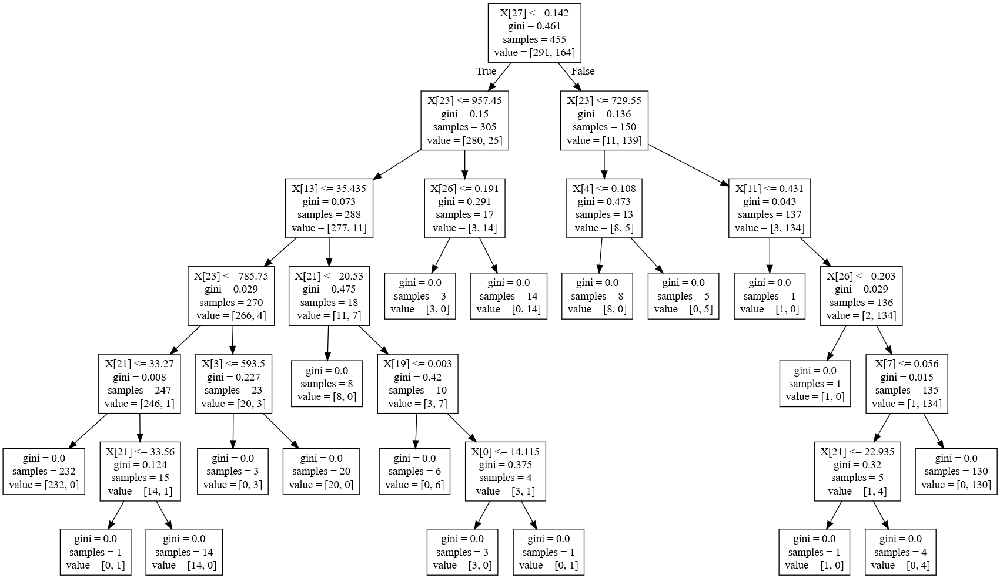

In [10]:
Image("HW3_Q3_Tree.png")

2. (10pts) We can guide the learning of a Decision Tree classifier by specifying various parameters governing its construction. For example, the max_depth parameter forces the algorithm to stop after at most that many levels, the min_samples_split parameter lower bounds the amount of data required to split nodes when learning and the parameter called criterion determines what function to use to create splits at each node. For both type of criteria, gini and entropy, test the max_depth values in the range 1, 2, ..., 20 , and min_samples_split in the range $2^{1}, 2^{2}, ..., 2^{15}$. Visualise the best classification trees that you get for different criterion parameter and observe how do they differ. 

In [11]:
depth = list(range(20))
for i in depth: depth[i] += 1

min_samp = []
for i in range(15):
    min_samp.append(2**(i+1))


In [12]:
best_depth = 0
best_min = 0
best_acc = 0

depth_l = []
min_l = []
acc_l = []

for i in depth:
    for j in min_samp:
        clf = tree.DecisionTreeClassifier(random_state=0, criterion='gini', max_depth = i, min_samples_split=j)
        clf.fit(x_train, y_train)
        
        pred = clf.predict(x_test)
        acc = accuracy_score(y_test, pred)
        
        if acc > best_acc:
            best_depth = i
            best_min = j
            best_acc= acc
        
        depth_l.append(i)
        min_l.append(j)
        acc_l.append(acc)
        
df = pd.DataFrame([acc_l, depth_l, min_l]).T
df.columns = ['accuracy', 'max_depth', 'min_samples_split']
df.sort_values(by='accuracy', ascending = False).head(10)

,accuracy,max_depth,min_samples_split
262,0.973684,18.0,256.0
127,0.973684,9.0,256.0
82,0.973684,6.0,256.0
202,0.973684,14.0,256.0
22,0.973684,2.0,256.0
67,0.973684,5.0,256.0
187,0.973684,13.0,256.0
37,0.973684,3.0,256.0
157,0.973684,11.0,256.0
112,0.973684,8.0,256.0


In [13]:
clf = tree.DecisionTreeClassifier(random_state=0, criterion='gini', max_depth = 18, min_samples_split=256)
clf.fit(x_train, y_train)

with open("HW3_Q3_2.dot", 'w') as f:
    f = tree.export_graphviz(clf, out_file=f)

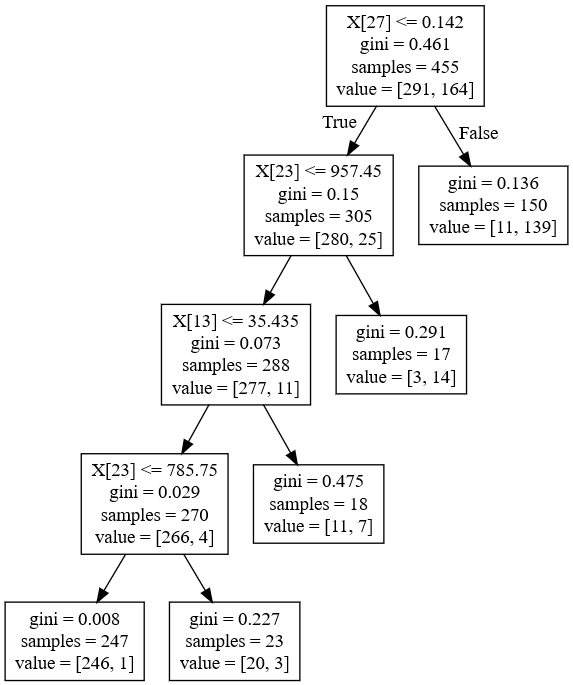

In [14]:
Image("HW3_Q3_Gini.png")

In [15]:
best_depth = 0
best_min = 0
best_acc = 0

depth_l = []
min_l = []
acc_l = []

for i in depth:
    for j in min_samp:
        clf = tree.DecisionTreeClassifier(random_state=0, criterion='entropy', max_depth = i, min_samples_split=j)
        clf.fit(x_train, y_train)
        
        pred = clf.predict(x_test)
        acc = accuracy_score(y_test, pred)
        
        if acc > best_acc:
            best_depth = i
            best_min = j
            best_acc= acc
        
        depth_l.append(i)
        min_l.append(j)
        acc_l.append(acc)
        
df = pd.DataFrame([acc_l, depth_l, min_l]).T
df.columns = ['accuracy', 'max_depth', 'min_samples_split']
df.sort_values(by='accuracy', ascending = False).head(10)

,accuracy,max_depth,min_samples_split
214,0.964912,15.0,32.0
64,0.964912,5.0,32.0
34,0.964912,3.0,32.0
259,0.964912,18.0,32.0
184,0.964912,13.0,32.0
79,0.964912,6.0,32.0
229,0.964912,16.0,32.0
94,0.964912,7.0,32.0
169,0.964912,12.0,32.0
244,0.964912,17.0,32.0


In [16]:
clf = tree.DecisionTreeClassifier(random_state=0, criterion='entropy', max_depth = 15, min_samples_split=32)
clf.fit(x_train, y_train)

with open("HW3_Q3_3.dot", 'w') as f:
    f = tree.export_graphviz(clf, out_file=f)

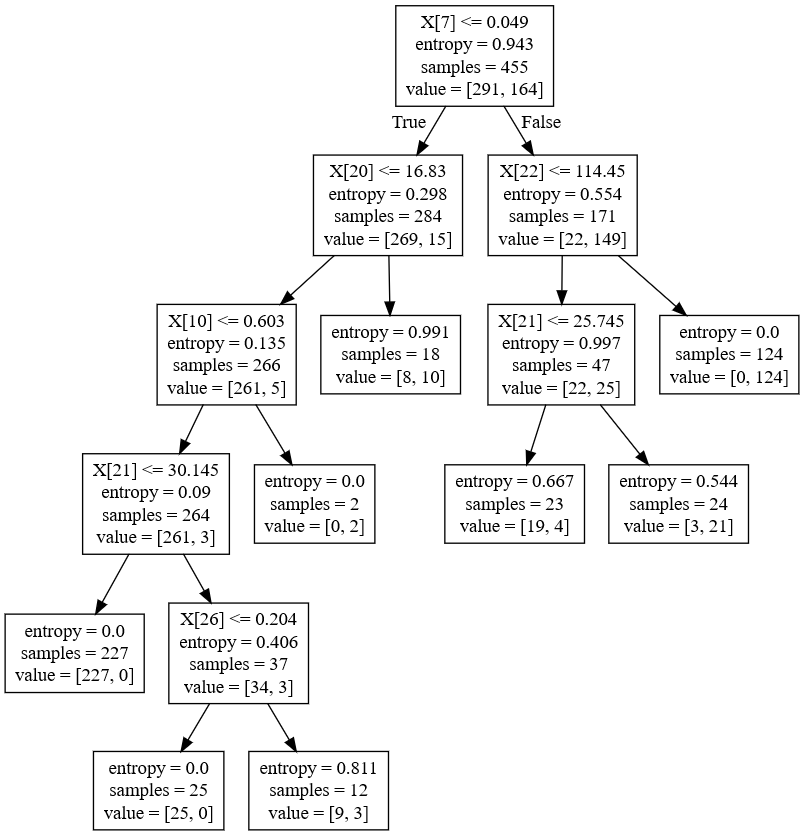

In [17]:
Image("HW3_Q3_Entropy.png")

The entropy tree splits on more variables than the gini tree does.  Additionally, the entropy tree has deeper branches than the gini tree does.  It is important to note that the gini tree performed best with large min_samples_split, but the entropy tree performed with similar accuracy with smaller min_samples_split.

## Question 4: Bayes Optimal Classification (5 pts)

1. Consider the following classification problem with only one input feature. We have two biased coins, coin 1 and 2. For coin 1, $P(heads) = p$ and for coin 2, $P(heads) = q$. We know that $p > q$. Given the output of a coin toss, we have to predict which coin was used for this toss. Assume we select both the coins for tossing with equal probability. What is the Bayes optimal classifier and what is its error rate?

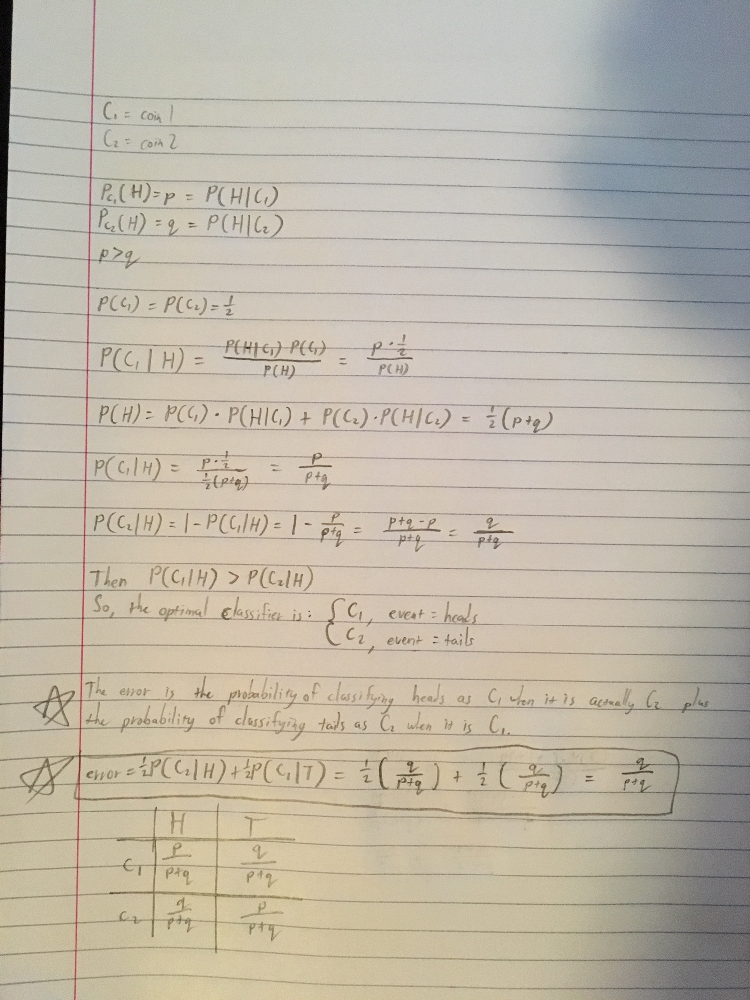

In [3]:
Image("HW3_Q4.png")